# Análise de Cluster Geográfica dos Crimes em São Francisco

## Link para os dados: https://www.kaggle.com/competitions/sf-crime/data

In [1]:
# Importando bibliotecas

from sklearn.cluster import KMeans
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline

In [2]:
# Carregando e visualizando os dados

dados = pd.read_csv("train.csv")
dados.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [3]:
dados_filtrados = dados.drop(["PdDistrict", "Address", "Resolution", "Descript", "DayOfWeek"], axis=1)

In [4]:
dados_filtrados.isnull().sum()

Dates       0
Category    0
X           0
Y           0
dtype: int64

In [5]:
f = lambda x: (x["Dates"].split("-"))[0]
dados_filtrados["Dates"] = dados_filtrados.apply(f, axis=1)
dados_filtrados

,Dates,Category,X,Y
0,2015,WARRANTS,-122.425892,37.774599
1,2015,OTHER OFFENSES,-122.425892,37.774599
2,2015,OTHER OFFENSES,-122.424363,37.800414
3,2015,LARCENY/THEFT,-122.426995,37.800873
4,2015,LARCENY/THEFT,-122.438738,37.771541
...,...,...,...,...
878044,2003,ROBBERY,-122.459033,37.714056
878045,2003,LARCENY/THEFT,-122.447364,37.731948
878046,2003,LARCENY/THEFT,-122.403390,37.780266
878047,2003,VANDALISM,-122.390531,37.780607


In [6]:
dados_2014 = dados_filtrados[dados_filtrados["Dates"] == "2014"]
dados_2014.head()

,Dates,Category,X,Y
27584,2014,LARCENY/THEFT,-122.435563,37.760801
27585,2014,LARCENY/THEFT,-122.433575,37.800037
27586,2014,VEHICLE THEFT,-122.412777,37.786834
27587,2014,ASSAULT,-122.421702,37.773641
27588,2014,ASSAULT,-122.421702,37.773641


In [7]:
# Scalando os dados

scaler = MinMaxScaler()

# Y é a Latitude e X a Longitude

scaler.fit(dados_2014[["X"]])
dados_2014["X_Escalado"] = scaler.transform(dados_2014[["X"]])

scaler.fit(dados_2014[["Y"]])
dados_2014["Y_Escalado"] = scaler.transform(dados_2014[["Y"]])

c:\Users\Rodolfo\anaconda3\envs\Plotly_encodestring\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Rodolfo\anaconda3\envs\Plotly_encodestring\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [8]:
dados_2014.head()

,Dates,Category,X,Y,X_Escalado,Y_Escalado
27584,2014,LARCENY/THEFT,-122.435563,37.760801,0.526134,0.471397
27585,2014,LARCENY/THEFT,-122.433575,37.800037,0.539528,0.821894
27586,2014,VEHICLE THEFT,-122.412777,37.786834,0.679676,0.703952
27587,2014,ASSAULT,-122.421702,37.773641,0.619540,0.586098
27588,2014,ASSAULT,-122.421702,37.773641,0.619540,0.586098


In [9]:
# Decidindo a quantidade de Clusters pelo Método de Elbow

k_range = range(1,20)

list_dist = []

for k in k_range:
    model = KMeans(n_clusters=k)
    model.fit(dados_2014[["X_Escalado", "Y_Escalado"]])
    list_dist.append(model.inertia_)

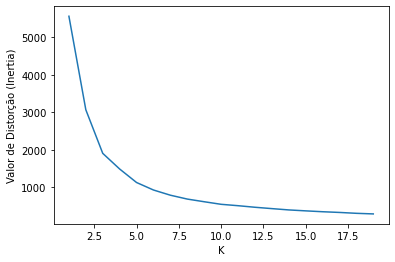

In [10]:
plt.xlabel("K")
plt.ylabel("Valor de Distorção (Inertia)")
plt.plot(k_range, list_dist)
plt.show()

In [11]:
#  Construindo o modelo

KM = KMeans(n_clusters=8)
y_predito = KM.fit_predict(dados_2014[["X_Escalado", "Y_Escalado"]])
y_predito

array([6, 4, 1, ..., 1, 2, 4])

In [12]:
dados_2014["Cluster"] = y_predito
dados_2014

c:\Users\Rodolfo\anaconda3\envs\Plotly_encodestring\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Dates,Category,X,Y,X_Escalado,Y_Escalado,Cluster
27584,2014,LARCENY/THEFT,-122.435563,37.760801,0.526134,0.471397,6
27585,2014,LARCENY/THEFT,-122.433575,37.800037,0.539528,0.821894,4
27586,2014,VEHICLE THEFT,-122.412777,37.786834,0.679676,0.703952,1
27587,2014,ASSAULT,-122.421702,37.773641,0.619540,0.586098,1
27588,2014,ASSAULT,-122.421702,37.773641,0.619540,0.586098,1
...,...,...,...,...,...,...,...
102345,2014,OTHER OFFENSES,-122.387235,37.719401,0.851793,0.101571,2
102346,2014,WARRANTS,-122.387235,37.719401,0.851793,0.101571,2
102347,2014,FRAUD,-122.418382,37.783258,0.641908,0.672007,1
102348,2014,NON-CRIMINAL,-122.413652,37.728320,0.673778,0.181249,2


In [13]:
# Visualizando nosso resultado

figure = px.scatter_mapbox(dados_2014, lat="Y", lon="X", center=dict(lat = 37.8, lon=-122.4), 
                           zoom=9, opacity=.9, mapbox_style="open-street-map", color = "Cluster", 
                           title="Crimes em São Francisco", width=1100, height=700, hover_data=["Cluster",
                                                                                                "Category", "Y", "X"])

In [14]:
figure.show()

In [15]:
# Visualizando informações Offline

import plotly
plotly.offline.plot(figure, filename = "mptest.html", auto_open=True)

'mptest.html'

In [ ]:
# Infos da biblioteca

help(px.scatter_mapbox)